In [1]:
%load_ext autoreload
%autoreload 2
!hostname
!pwd
import os, sys
print(sys.executable)
os.environ['CUDA_VISIBLE_DEVICES'] = "4"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

fish-gcp005
/home/akarshkumar0101/nca-alife/src
/home/akarshkumar0101/miniconda3/envs/nca-alife-torch/bin/python


In [2]:
import os, sys, glob, pickle
from functools import partial

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

from tqdm.auto import tqdm
from einops import rearrange, reduce, repeat

In [3]:
import experiment_utils
import util

# Create Experiment

In [4]:
! rm -rf ./experiments
! mkdir -p ./experiments

In [41]:
cfg_default = dict(
    seed=0, save_dir=None, dtype='float32', device='cuda:0',
    
    img_size=128, d_state=16, perception='fullconv', kernel_size=3, 
    init_state="randn", padding_mode="circular", dt=0.01, dropout=0.5,
    
    prompts="a diverse ecosystem of cells moving around", spatial_scales="1.0", clip_model="clip-vit-base-patch32",
    coef_alignment=1.,
    
    optical_flow_mag=1., coef_optical_flow=0.,
    
    rollout_steps=1024, bptt_steps=16, pool_size=1024,
    bs=8, lr=5e-4, n_iters=100000, clip_grad_norm=1.
)

seeds = np.arange(1)

optical_flow_mag_sweep = [1e-1, 3e-1, 1e0, 3e0, 1e1]
coef_optical_flow_sweep = [0., 1e-2, 1e-1, 1e0, 1e1]

cfgs = []
for seed in seeds:
    for optical_flow_mag in optical_flow_mag_sweep:
        for coef_optical_flow in coef_optical_flow_sweep:
            cfg = cfg_default.copy()
            cfg.update(seed=seed, optical_flow_mag=optical_flow_mag, coef_optical_flow=coef_optical_flow)
            cfg.update(save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_optflow/{seed}_{optical_flow_mag:.4f}_{coef_optical_flow:.4f}")
            cfgs.append(cfg)

# print(cfgs)
print(len(cfgs))

25


In [42]:
commands = experiment_utils.create_commands(cfgs, prefix='python train_nca_temporal_emergence.py', out_file='./experiments/main.sh')
print('\n'.join(commands[:3]), '\n...')
print(len(commands), 'commands')

python train_nca_temporal_emergence.py --seed=0 --save_dir="/home/akarshkumar0101/nca-alife-data/nca_optflow/0_0.1000_0.0000"   --dtype="float32" --device="cuda:0" --img_size=128 --d_state=16 --perception="fullconv" --kernel_size=3 --init_state="randn" --padding_mode="circular" --dt=0.01 --dropout=0.5 --prompts="a diverse ecosystem of cells moving around" --spatial_scales="1.0" --clip_model="clip-vit-base-patch32" --coef_alignment=1.0 --optical_flow_mag=0.1  --coef_optical_flow=0.0  --rollout_steps=1024 --bptt_steps=16 --pool_size=1024 --bs=8 --lr=0.0005 --n_iters=100000 --clip_grad_norm=1.0
python train_nca_temporal_emergence.py --seed=0 --save_dir="/home/akarshkumar0101/nca-alife-data/nca_optflow/0_0.1000_0.0100"   --dtype="float32" --device="cuda:0" --img_size=128 --d_state=16 --perception="fullconv" --kernel_size=3 --init_state="randn" --padding_mode="circular" --dt=0.01 --dropout=0.5 --prompts="a diverse ecosystem of cells moving around" --spatial_scales="1.0" --clip_model="clip-v

# Visualize Results

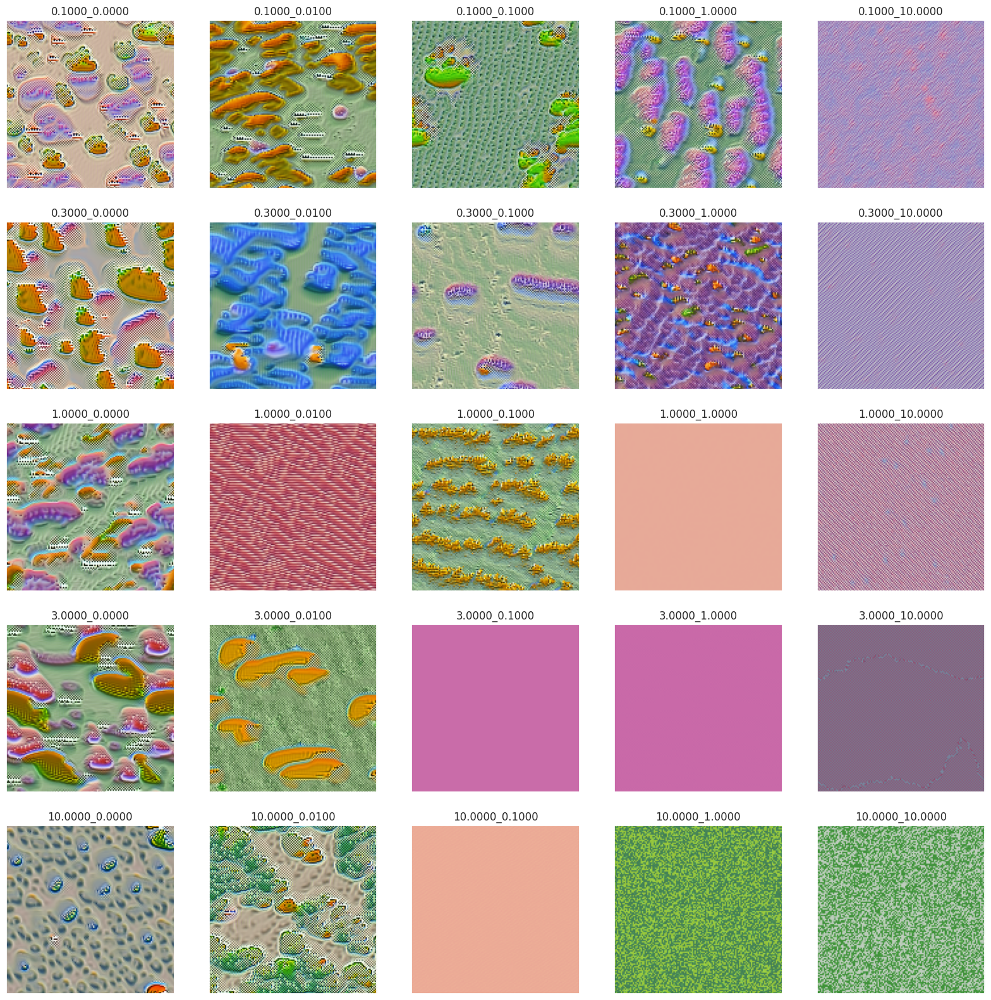

In [7]:
plt.figure(figsize=(20, 20))
iplt = 0

seed = 0
for optical_flow_mag in optical_flow_mag_sweep:
    for coef_optical_flow in coef_optical_flow_sweep:
        save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_optflow/{seed}_{optical_flow_mag:.4f}_{coef_optical_flow:.4f}"
        vid = util.load_pkl(save_dir, 'vid').astype(np.uint8)

        iplt += 1
        plt.subplot(5, 5, iplt)
        plt.imshow(vid[1023])
        plt.grid(False); plt.xticks([]); plt.yticks([])
        plt.title(f"{optical_flow_mag:.4f}_{coef_optical_flow:.4f}")
plt.show()

In [56]:
optical_flow_mag_sweep

[0.1, 0.3, 1.0, 3.0, 10.0]

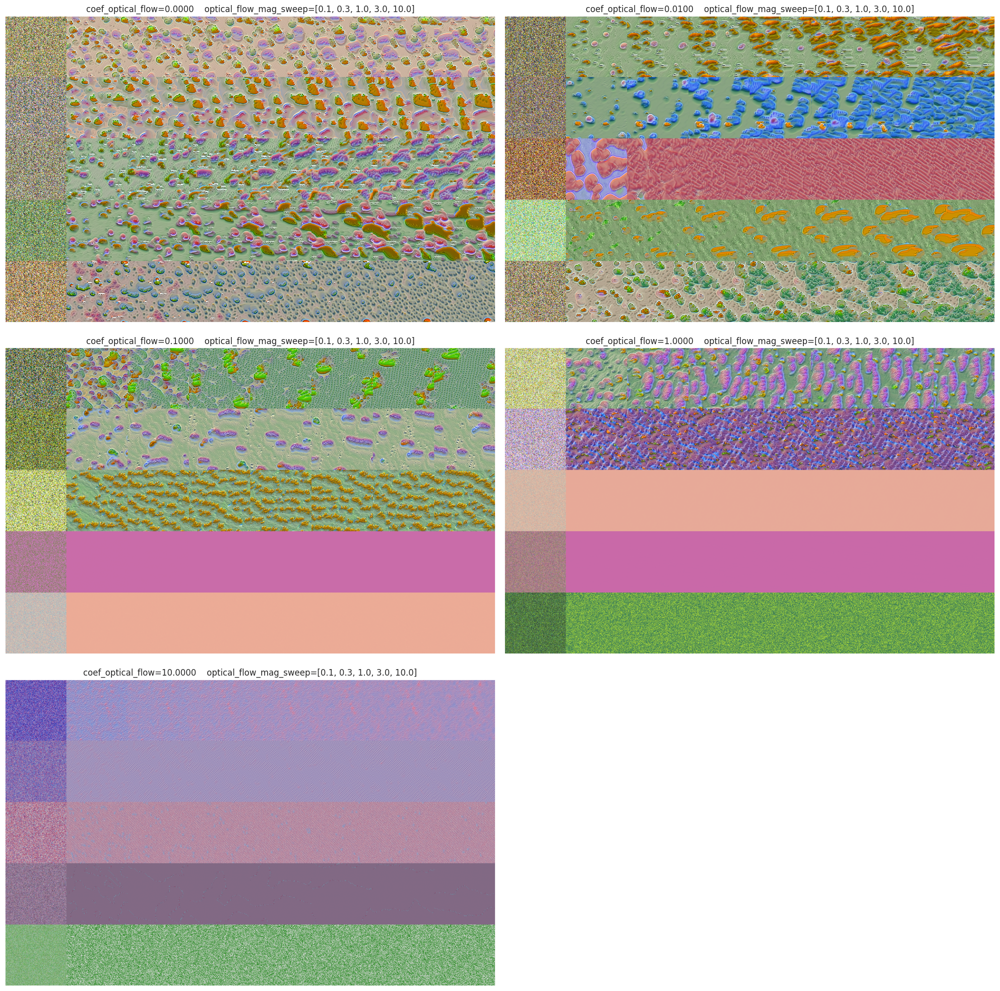

In [57]:
plt.figure(figsize=(20, 20))
iplt = 0

seed = 0
for coef_optical_flow in coef_optical_flow_sweep:
    img = []
    for optical_flow_mag in optical_flow_mag_sweep:
        save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_optflow/{seed}_{optical_flow_mag:.4f}_{coef_optical_flow:.4f}"
        vid = util.load_pkl(save_dir, 'vid').astype(np.uint8)
        img.append(vid[::vid.shape[0]//8])
    img = rearrange(img, "R C H W D -> (R H) (C W) D")

    iplt += 1
    plt.subplot(3, 2, iplt)
    plt.imshow(img)
    plt.grid(False); plt.xticks([]); plt.yticks([])
    plt.title(f"{coef_optical_flow=:.4f}    {optical_flow_mag_sweep=}")
plt.tight_layout()
plt.show()

In [76]:
import copy
df = []
for cfg in tqdm(cfgs):
    dfi = copy.copy(cfg)
    data = util.load_pkl(dfi['save_dir'], 'data')
    dfi['loss_alignment'] = torch.stack(data['loss_alignment']).cpu().numpy()[-10000:].mean()
    dfi['loss_optical_flow'] = torch.stack(data['loss_optical_flow']).cpu().numpy()[-10000:].mean()

    df.append(dfi)
df = pd.DataFrame(df)

  0%|          | 0/25 [00:00<?, ?it/s]

In [84]:
df_ori = df

In [97]:
df = df_ori
df['coef_optical_flow'] = pd.Categorical(df['coef_optical_flow'], categories=df['coef_optical_flow'].unique())
df['optical_flow_mag'] = pd.Categorical(df['optical_flow_mag'], categories=df['optical_flow_mag'].unique())

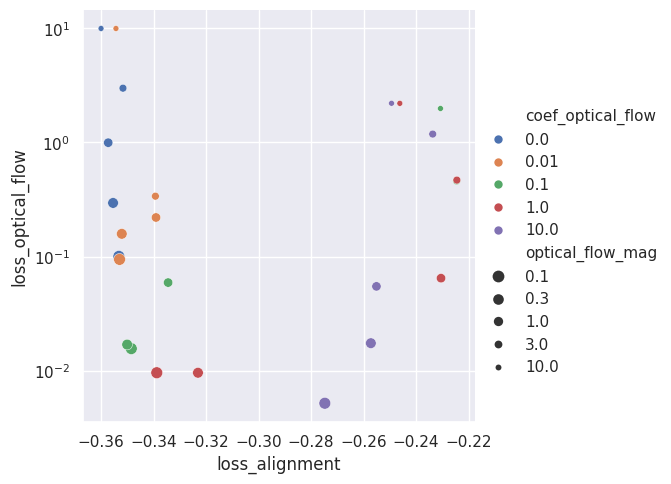

In [98]:
sns.relplot(data=df, x='loss_alignment', y='loss_optical_flow', hue='coef_optical_flow', size='optical_flow_mag')#, palette='flare')
plt.yscale('log')

In [44]:
import shutil
seed = 0
for optical_flow_mag in optical_flow_mag_sweep:
    for coef_optical_flow in coef_optical_flow_sweep:
        save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_optflow/{seed}_{optical_flow_mag:.4f}_{coef_optical_flow:.4f}"
        shutil.copy(f"{save_dir}/vid.gif", f"/home/akarshkumar0101/nca-alife-data/nca_optflow/gifs/coef={coef_optical_flow:.3f}_mag={optical_flow_mag:.3f}.gif")

In [ ]:
plt.figure(figsize=(20, 20))
iplt = 0

seed = 0
for optical_flow_mag in optical_flow_mag_sweep:
    for coef_optical_flow in coef_optical_flow_sweep:
        save_dir=f"/home/akarshkumar0101/nca-alife-data/nca_optflow/{seed}_{optical_flow_mag:.4f}_{coef_optical_flow:.4f}"
        vid = util.load_pkl(save_dir, 'vid').astype(np.uint8)

        iplt += 1
        plt.subplot(5, 5, iplt)
        plt.imshow(vid[1023])
        plt.grid(False); plt.xticks([]); plt.yticks([])
        plt.title(f"{optical_flow_mag:.4f}_{coef_optical_flow:.4f}")
plt.show()

In [13]:
import torch

In [9]:
data = util.load_pkl(save_dir, 'data')

In [10]:
data.keys()

dict_keys(['grad_norm', 'loss_alignment', 'loss_temporal_softmax', 'loss_spatial_softmax', 'loss_temporal_novelty', 'loss_spatial_novelty', 'loss_optical_flow', 'loss', 'grad_bptt'])

In [21]:
for k in data:
    print(k)
    v = torch.tensor(data[k])
    print(v.shape, v.dtype)
    print()

grad_norm
torch.Size([100000]) torch.float32

loss_alignment
torch.Size([100000]) torch.float32

loss_temporal_softmax
torch.Size([100000]) torch.float32

loss_spatial_softmax
torch.Size([100000]) torch.float32

loss_temporal_novelty
torch.Size([100000]) torch.float32

loss_spatial_novelty
torch.Size([100000]) torch.float32

loss_optical_flow
torch.Size([100000]) torch.float32

loss
torch.Size([100000]) torch.float32

grad_bptt
torch.Size([100000, 8]) torch.float32



In [22]:
100000*4/1e9 * 10

0.004

In [26]:
a = torch.stack(data['loss'])

In [28]:
a = a.cpu().numpy()

In [29]:
a.shape

(100000,)

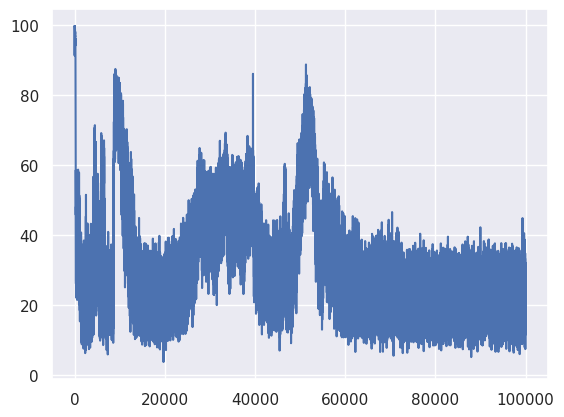

In [30]:
plt.plot(a)

In [4]:
from MSOEmultiscale import MyOpticalFlowNet
import torch

In [5]:
net = MyOpticalFlowNet(torch.device('cuda'), torch.float32)

In [25]:
x = y = torch.linspace(-1, 1, 64)
x, y = torch.meshgrid(x, y, indexing='ij')
mask = (x**2 + y**2 < .5**2)
img1 = repeat(mask.to(torch.float), "H W -> 1 3 H W").to('cuda')
mask = (x**2 + y**2 < .6**2)
img2 = repeat(mask.to(torch.float), "H W -> 1 3 H W").to('cuda')

In [26]:
flow = net.get_optical_flow(img1, img2)

torch.Size([1, 1, 64, 64, 2])


In [28]:
x, y = x.cpu().numpy(), y.cpu().numpy()
u, v = flow[0].cpu().numpy()

In [29]:
u.shape, v.shape

((64, 64), (64, 64))

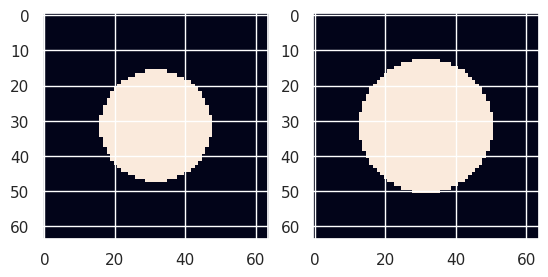

In [38]:
plt.subplot(121)
plt.imshow(img1.cpu().numpy()[0, 0])
plt.subplot(122)
plt.imshow(img2.cpu().numpy()[0, 0])

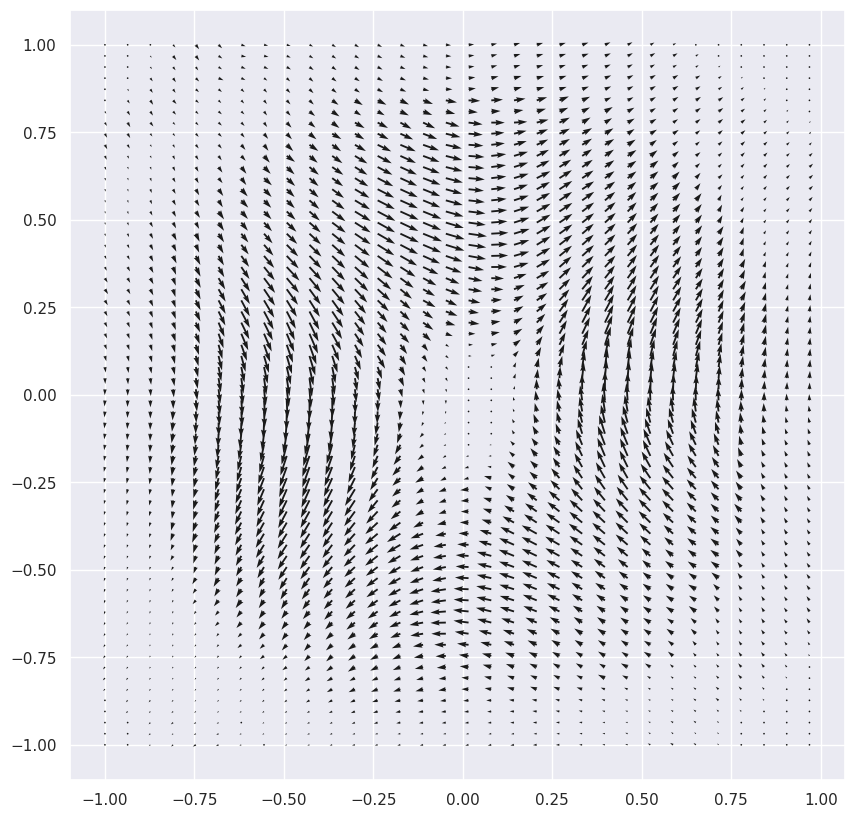

In [39]:
plt.figure(figsize=(10, 10))
plt.quiver(x[::2], y[::2], u[::2], v[::2])